In [ ]:
!pip install torchtext==0.8.1
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 7.0MB 8.1MB/s 
     |████████████████████████████████| 776.8MB 17kB/s 
ERROR: torchvision 0.9.1+cu101 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.
  Found existing installation: torch 1.8.1+cu101
    Uninstalling torch-1.8.1+cu101:
      Successfully uninstalled torch-1.8.1+cu101
  Found existing installation: torchtext 0.9.1
    Uninstalling torchtext-0.9.1:
      Successfully uninstalled torchtext-0.9.1
     |████████████████████████████████| 727kB 8.1MB/s 
     |████████████████████████████████| 51kB 6.4MB/s 
     |████████████████████████████████| 194kB 13.0MB/s 
     |████████████████████████████████| 1.2MB 15.8MB/s 
     |████████████████████████████████| 61kB 8.9MB/s 
     |████████████████████████████████| 51kB 8.8MB/s 
     |████████████████████████████████| 12.8MB 248kB/s 
Mounted at /content/gdrive


In [ ]:
from fastbook import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [ ]:
# Stanford Dogs Dataset URLs
images_url = "http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar"
lists_url = "http://vision.stanford.edu/aditya86/ImageNetDogs/lists.tar"

In [ ]:
# custom extract function, modeled off the default, but for .tar instead of .tgz
def tar_file_extract(fname, dest=None):
  tarfile.open(fname, 'r:tar').extractall(dest)
# open the tarred image dataset
path = untar_data(images_url, extract_func=tar_file_extract)

In [ ]:
Path.BASE_PATH = path
path.ls()

(#120) [Path('n02086240-Shih-Tzu'),Path('n02105056-groenendael'),Path('n02113023-Pembroke'),Path('n02105251-briard'),Path('n02107142-Doberman'),Path('n02088466-bloodhound'),Path('n02100583-vizsla'),Path('n02095570-Lakeland_terrier'),Path('n02106030-collie'),Path('n02107683-Bernese_mountain_dog')...]

In [ ]:
(path/"n02096294-Australian_terrier").ls()

(#196) [Path('n02096294-Australian_terrier/n02096294_4201.jpg'),Path('n02096294-Australian_terrier/n02096294_5466.jpg'),Path('n02096294-Australian_terrier/n02096294_8268.jpg'),Path('n02096294-Australian_terrier/n02096294_5602.jpg'),Path('n02096294-Australian_terrier/n02096294_1629.jpg'),Path('n02096294-Australian_terrier/n02096294_2118.jpg'),Path('n02096294-Australian_terrier/n02096294_4435.jpg'),Path('n02096294-Australian_terrier/n02096294_6213.jpg'),Path('n02096294-Australian_terrier/n02096294_8157.jpg'),Path('n02096294-Australian_terrier/n02096294_1400.jpg')...]

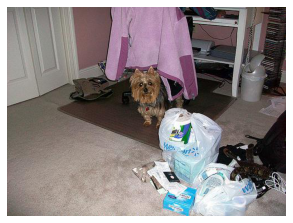

In [ ]:
fname = (path/"n02096294-Australian_terrier").ls()[0]
im = Image.open(fname)
show_image(im)

In [ ]:
# regex to parse the breed name from the parent folder name
re.findall(r'-([a-zA-Z_-]+)$', str(fname.parent))

['Australian_terrier']

In [ ]:
# datablock loader is based on the pet breeds example, but with labeler updated
# not sure what the best image sizes to use for transforms, but initial results
# seem good with these
dogs = DataBlock(blocks=(ImageBlock, CategoryBlock),
                 get_items=get_image_files,
                 splitter=RandomSplitter(seed=42),
                 get_y=using_attr(RegexLabeller(r'-([a-zA-Z_-]+)$'), 'parent'),
                 item_tfms=Resize(460),
                 batch_tfms=aug_transforms(size=224, min_scale=0.75))
dls = dogs.dataloaders(path)

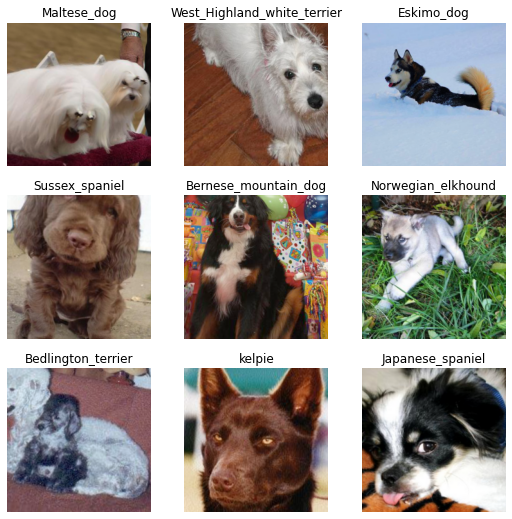

In [ ]:
dls.show_batch()

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(3)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.551338,0.645643,0.198251,03:05


epoch,train_loss,valid_loss,error_rate,time
0,1.058951,0.697294,0.219631,03:16
1,0.827020,0.552103,0.174198,03:16
2,0.525533,0.497182,0.153790,03:15


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.most_confused(min_val=5)

[('Eskimo_dog', 'Siberian_husky', 15),
 ('miniature_poodle', 'toy_poodle', 11),
 ('Siberian_husky', 'Eskimo_dog', 10),
 ('standard_schnauzer', 'miniature_schnauzer', 10),
 ('English_foxhound', 'Walker_hound', 9),
 ('Tibetan_mastiff', 'Newfoundland', 8),
 ('Italian_greyhound', 'whippet', 7),
 ('Lhasa', 'Shih-Tzu', 7),
 ('toy_poodle', 'miniature_poodle', 7),
 ('Cardigan', 'Pembroke', 6),
 ('Eskimo_dog', 'malamute', 6),
 ('Irish_wolfhound', 'Scottish_deerhound', 6),
 ('Staffordshire_bullterrier', 'American_Staffordshire_terrier', 6),
 ('collie', 'Shetland_sheepdog', 6),
 ('silky_terrier', 'Yorkshire_terrier', 6),
 ('Airedale', 'Lakeland_terrier', 5),
 ('American_Staffordshire_terrier', 'Staffordshire_bullterrier', 5),
 ('Border_collie', 'collie', 5),
 ('Great_Pyrenees', 'Samoyed', 5),
 ('Norwich_terrier', 'Norfolk_terrier', 5),
 ('collie', 'Border_collie', 5)]

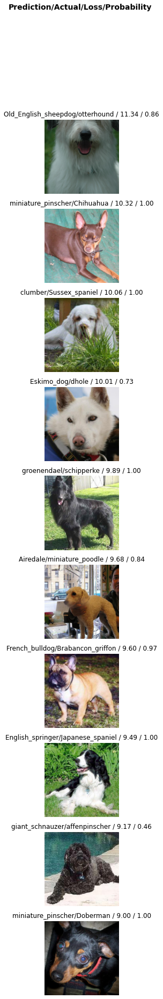

In [ ]:
interp.plot_top_losses(10, nrows=10)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
dls = dogs.dataloaders(path)

SuggestedLRs(lr_min=0.006918309628963471, lr_steep=0.005248074419796467)

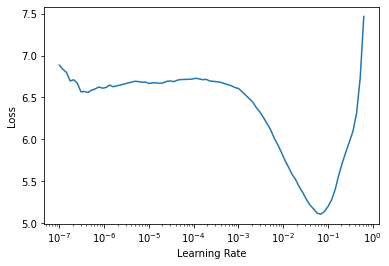

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.lr_find()

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fit_one_cycle(3, lr_max=6e-3)

epoch,train_loss,valid_loss,error_rate,time
0,1.651144,1.136377,0.313487,03:04
1,1.118097,0.714088,0.216282,03:04
2,0.734048,0.559152,0.172539,03:03


SuggestedLRs(lr_min=3.0199516913853586e-06, lr_steep=7.585775847473997e-07)

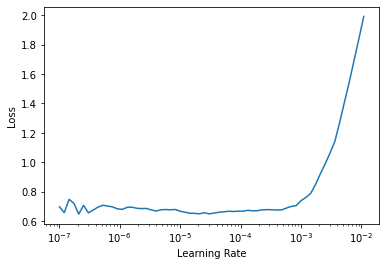

In [ ]:
learn.unfreeze()
learn.lr_find()

In [ ]:
learn.fit_one_cycle(5, lr_max=1e-5)

epoch,train_loss,valid_loss,error_rate,time
0,0.642216,0.538655,0.165978,03:17
1,0.616325,0.526026,0.162819,03:16
2,0.561341,0.520122,0.165492,03:16
3,0.553960,0.510553,0.159174,03:15
4,0.530570,0.513338,0.162333,03:16


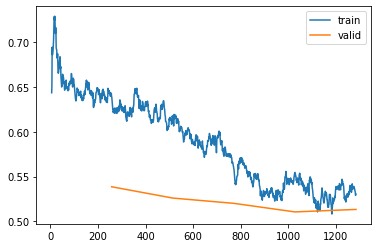

In [ ]:
learn.recorder.plot_loss()

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fit_one_cycle(10, 6e-3)
learn.unfreeze()
learn.fit_one_cycle(5, lr_max=slice(1e-6, 1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,1.360711,0.652885,0.200972,03:03
1,1.346560,1.217010,0.325881,03:01
2,1.287666,0.996984,0.275577,03:02
3,1.061278,0.797796,0.236938,03:03
4,0.919203,0.745150,0.221385,03:04
5,0.783442,0.662411,0.197084,03:05
6,0.630301,0.577957,0.175213,03:05
7,0.580976,0.521688,0.159903,03:05
8,0.469371,0.500987,0.154070,03:05
9,0.432095,0.500913,0.156258,03:05


epoch,train_loss,valid_loss,error_rate,time
0,0.426996,0.496698,0.153827,03:19
1,0.420362,0.494800,0.151640,03:18
2,0.412090,0.488253,0.152126,03:18
3,0.388742,0.488957,0.154556,03:18
4,0.357683,0.488413,0.152612,03:17


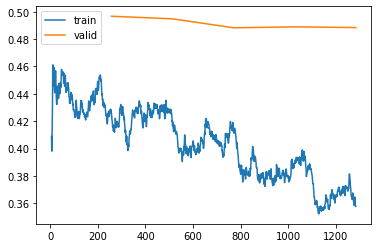

In [ ]:
learn.recorder.plot_loss()

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.most_confused(min_val=5)

[('Eskimo_dog', 'Siberian_husky', 13),
 ('Irish_wolfhound', 'Scottish_deerhound', 10),
 ('miniature_schnauzer', 'standard_schnauzer', 10),
 ('American_Staffordshire_terrier', 'Staffordshire_bullterrier', 9),
 ('miniature_poodle', 'toy_poodle', 9),
 ('silky_terrier', 'Yorkshire_terrier', 9),
 ('English_foxhound', 'Walker_hound', 8),
 ('Lhasa', 'Shih-Tzu', 8),
 ('Norfolk_terrier', 'Norwich_terrier', 8),
 ('Scottish_deerhound', 'Irish_wolfhound', 8),
 ('kuvasz', 'Great_Pyrenees', 8),
 ('wire-haired_fox_terrier', 'Lakeland_terrier', 7),
 ('Cardigan', 'Pembroke', 6),
 ('Siberian_husky', 'malamute', 6),
 ('Staffordshire_bullterrier', 'American_Staffordshire_terrier', 6),
 ('malamute', 'Siberian_husky', 6),
 ('toy_poodle', 'miniature_poodle', 6),
 ('EntleBucher', 'Appenzeller', 5),
 ('Eskimo_dog', 'malamute', 5),
 ('Greater_Swiss_Mountain_dog', 'EntleBucher', 5),
 ('Lhasa', 'Maltese_dog', 5),
 ('Walker_hound', 'English_foxhound', 5),
 ('collie', 'Border_collie', 5),
 ('toy_terrier', 'miniatur

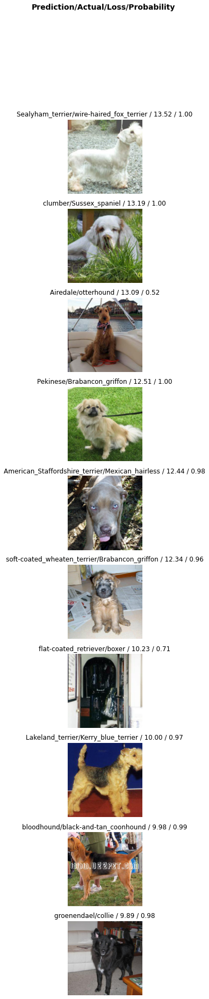

In [ ]:
interp.plot_top_losses(10, nrows=10)

In [ ]:
learn.export(fname='dog_breed_resnet34.pkl')